In [1]:
import keras
from keras import models
from keras.utils import plot_model
from keras.applications import VGG16
from keras.preprocessing import image
import numpy as np
import h5py

%matplotlib inline
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg

Using TensorFlow backend.
/home/cyj/miniconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [2]:
# read and show query image
img_path = "82.png"
# We preprocess the image into a 4D tensor

img = image.load_img(img_path, target_size=(224, 224))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)


(1, 224, 224, 3)


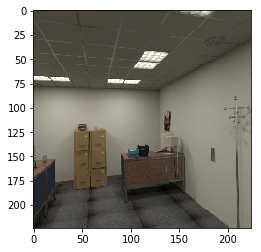

In [3]:
plt.imshow(img_tensor[0])
plt.show()

In [4]:

model1 = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))


model1.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [5]:

# Extracts the outputs of the top 19 layers:
layer_outputs = [layer.output for layer in model1.layers[:19]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model1.input, outputs=layer_outputs)

In [6]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

In [79]:

first_layer_activation = activations[7]
#print(first_layer_activation.shape)


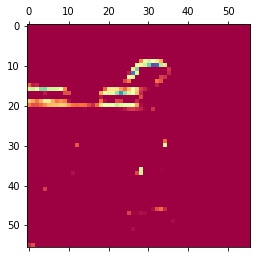

In [80]:

plt.matshow(first_layer_activation[0,:, :, 0], cmap='Spectral')
plt.show()


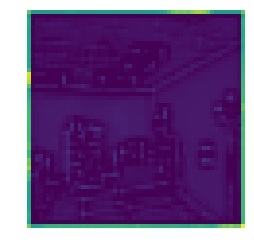

In [81]:

plt.imshow(first_layer_activation[0, :, :, 2], cmap='viridis')
plt.axis('off') #关闭坐标刻度
plt.grid(False)
plt.savefig('/home/cyj/Pictures/VP/111.png')
plt.show()


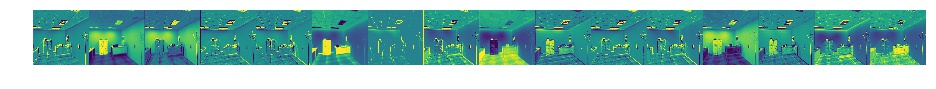

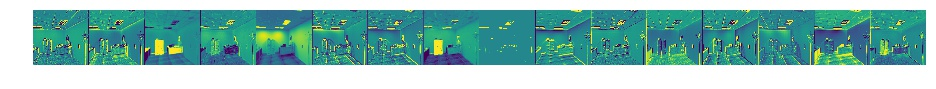

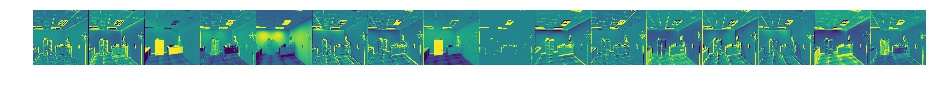

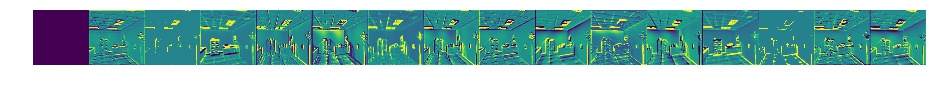

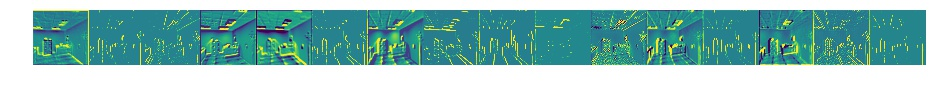

...

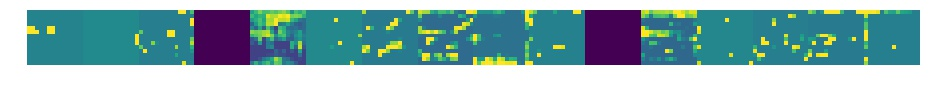

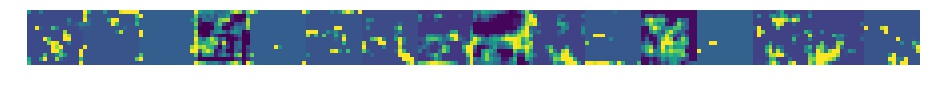

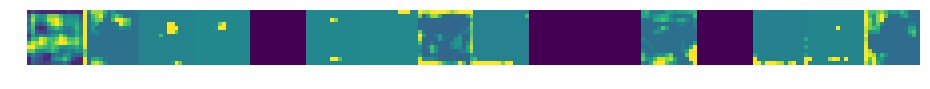

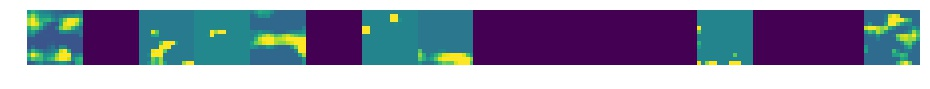

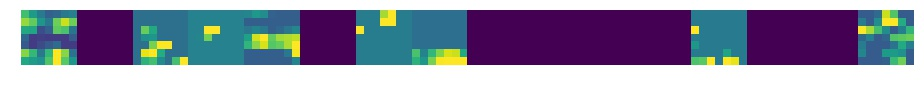

In [100]:
import keras
from IPython.display import set_matplotlib_formats
set_matplotlib_formats("jpg")
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model1.layers[:19]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names[1:], activations[1:]):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    #display_grid = np.zeros((size * n_cols, images_per_row * size))
    display_grid = np.zeros((size , images_per_row * size))
    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image
        break

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    #plt.title(layer_name)
    plt.grid(False)
    plt.axis('off') #关闭坐标刻度
    img_path='/home/cyj/Pictures/VP/'+layer_name+'.png'
    
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.savefig(img_path,dpi=600)
    plt.show()

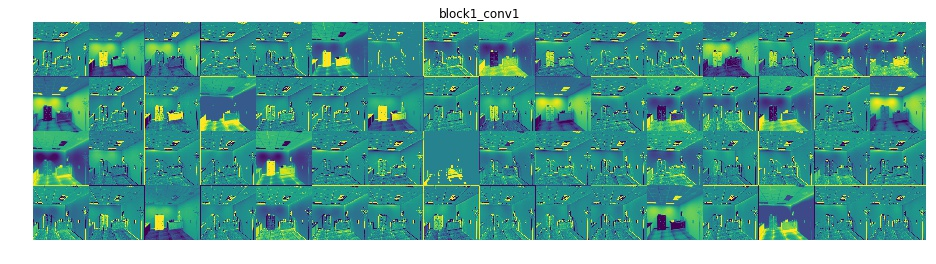

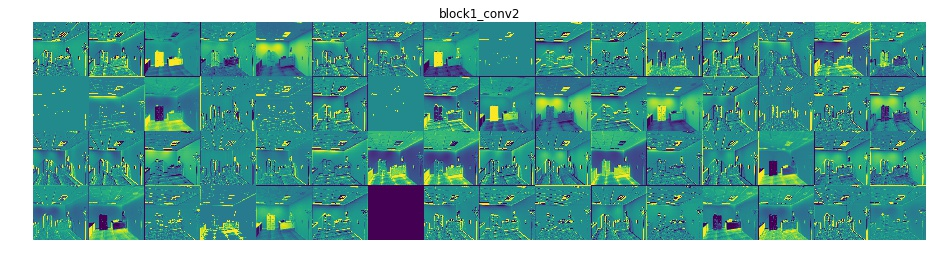

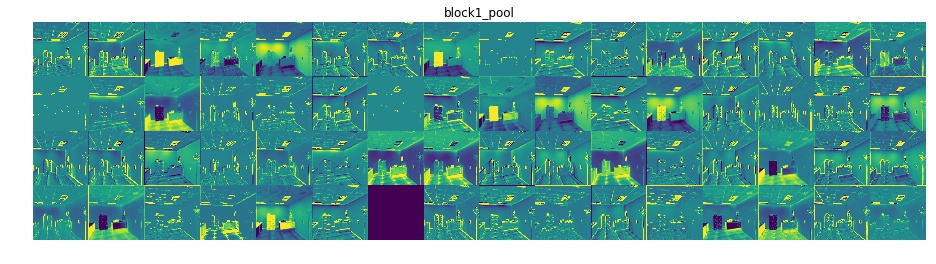

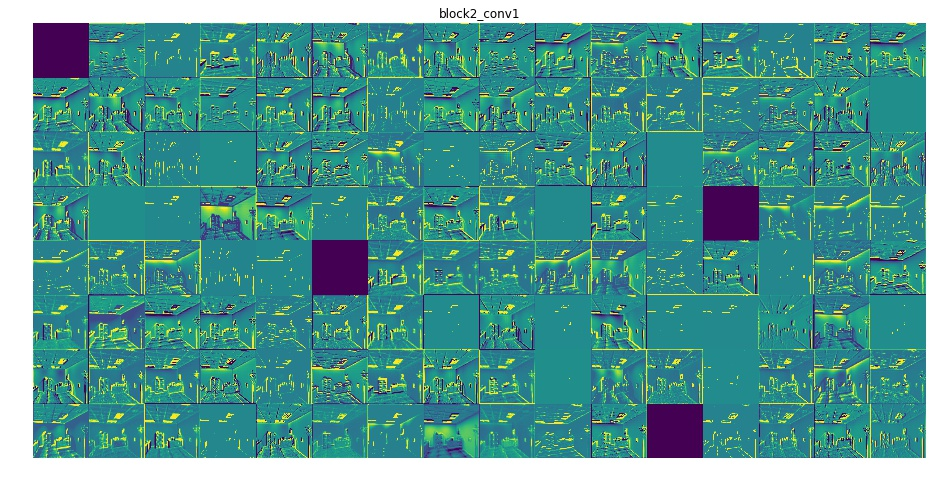

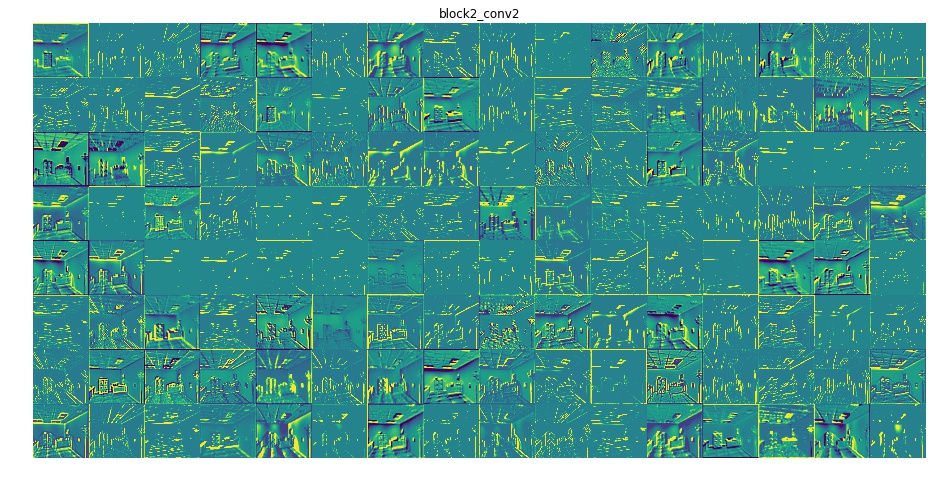

...

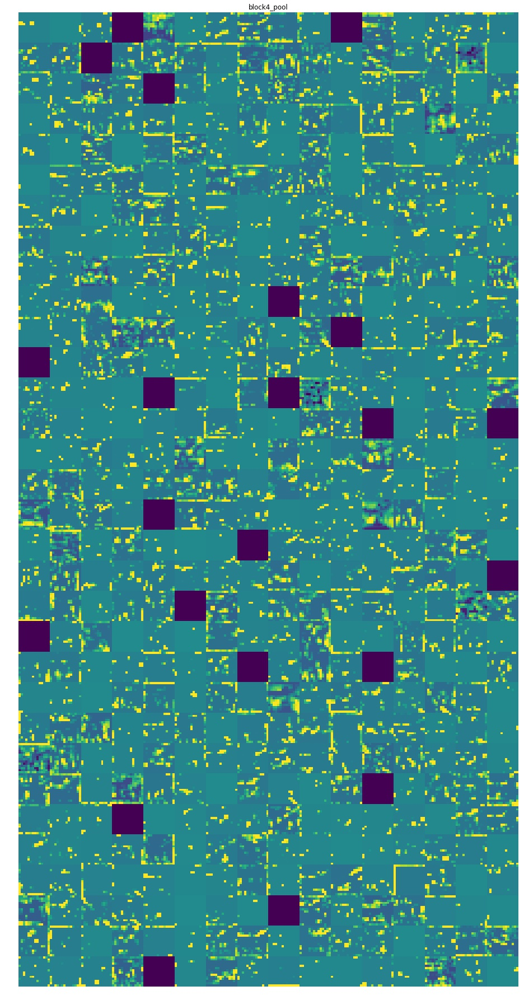

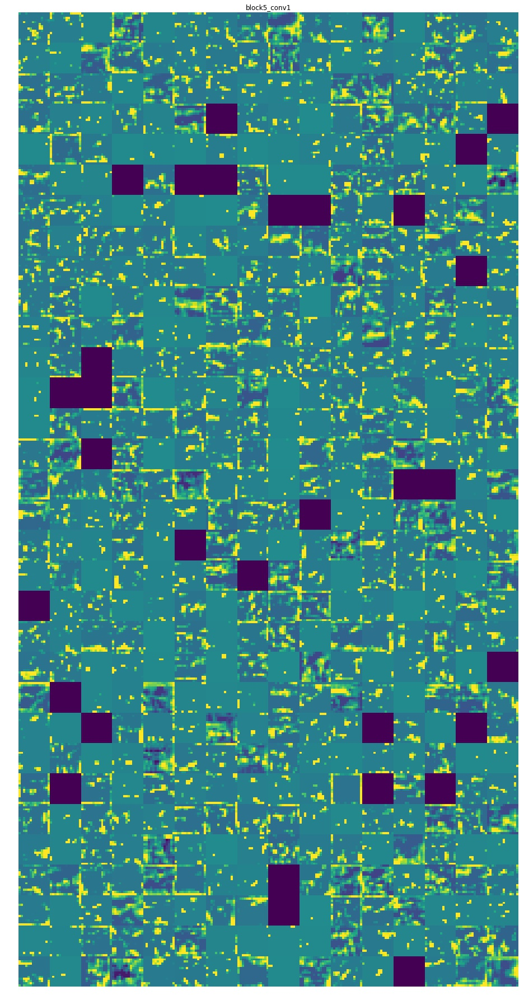

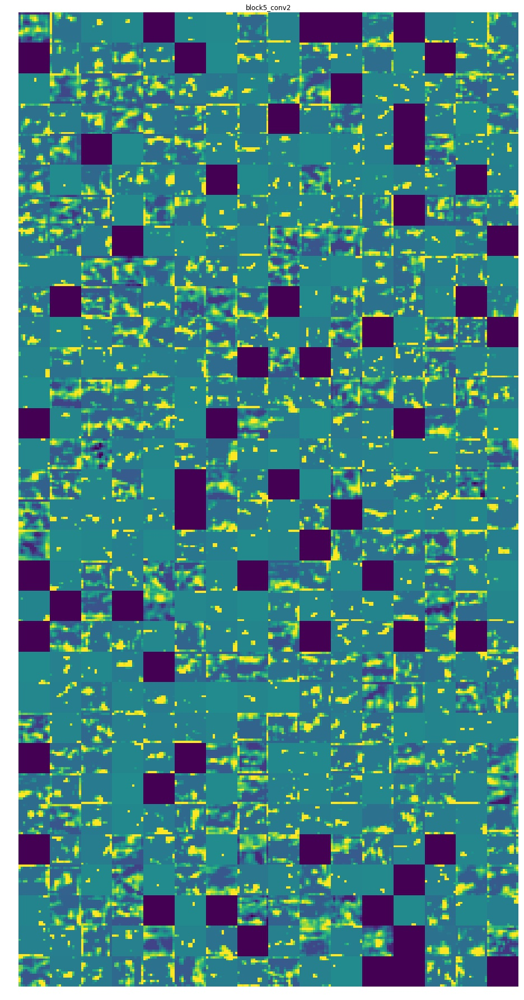

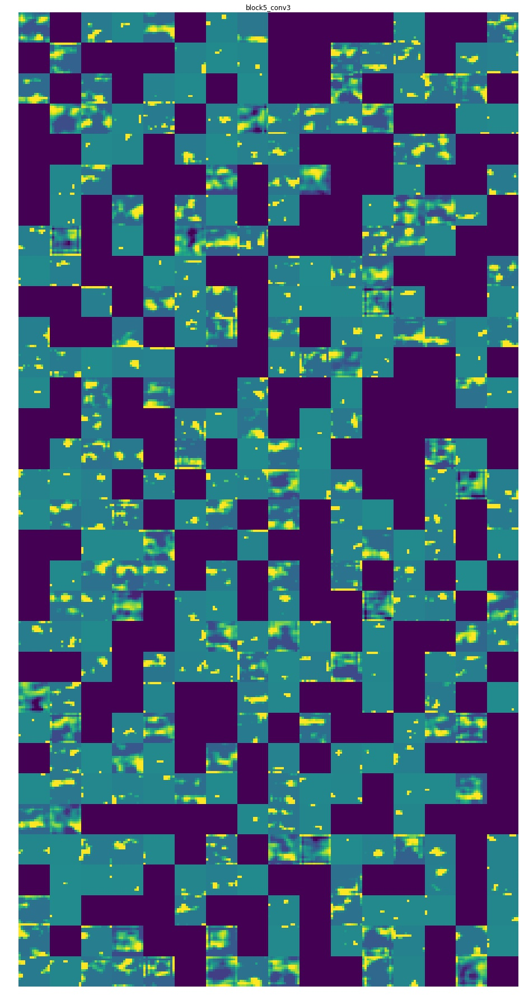

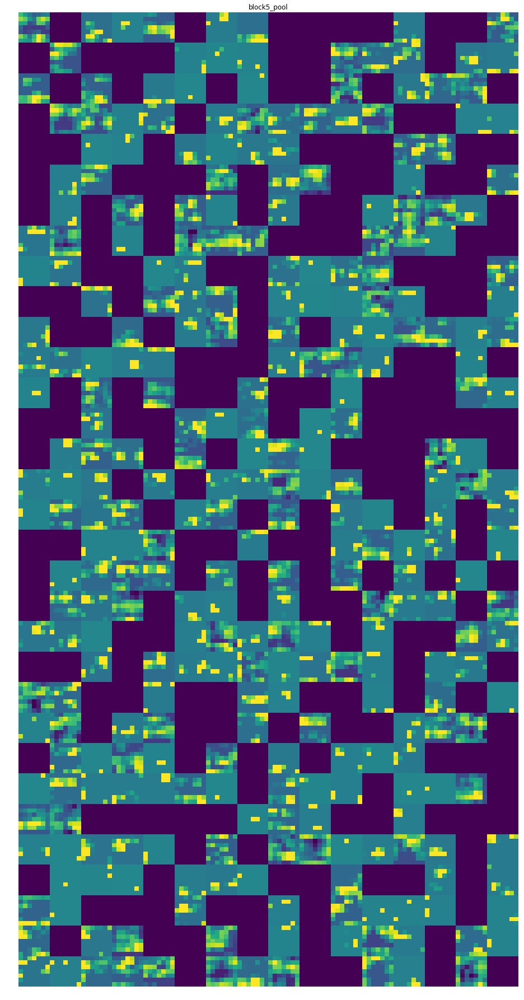

In [98]:
import keras
from IPython.display import set_matplotlib_formats
set_matplotlib_formats("jpg")
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model1.layers[:19]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names[1:], activations[1:]):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    # We'll tile each filter into this big horizontal grid

    for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0,
                                                 :, :,
                                                 col * images_per_row + row]
                # Post-process the feature to make it visually palatable
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size,
                             row * size : (row + 1) * size] = channel_image
    
    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis('off') #关闭坐标刻度
    img_path='/home/cyj/Pictures/VP/'+layer_name+'.png'
    
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    #plt.savefig(img_path,dpi=600)
    plt.show()